In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

/Users/nimishasingh/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
df = pd.read_csv('gurgaon_properties_missing_value_imputation.csv')

In [4]:
df

,property_type,society,sector,price,price_per_sqft,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,la vida by tata housing,sector 113,3.05,15561.0,3,4,3,3.0,Relatively New,2150.000000,0,1,0,0,0,0,174
1,flat,m3m woodshire,sector 107,0.88,6442.0,2,2,3+,3.0,Relatively New,1236.000000,0,0,0,0,0,0,99
2,house,vatika india next,sector 82,7.00,21605.0,4,4,3+,3.0,Relatively New,3900.000000,0,1,0,0,0,1,105
3,house,independent,sector 12,1.40,8701.0,2,2,1,2.0,Old Property,166.000000,0,0,0,0,0,0,0
4,flat,maxworth city residences,sector 10a,0.90,7081.0,2,2,3,9.0,New Property,1086.000000,0,0,0,0,1,0,52
5,flat,kiran residency,sector 56,1.50,7500.0,3,3,3+,4.0,Relatively New,1900.000000,0,1,0,0,0,2,126
6,flat,gls arawali homes,sohna road,0.29,6029.0,2,2,2,9.0,Relatively New,534.000000,0,0,0,0,0,0,55
7,flat,mapsko casa bella,sector 82,1.30,6379.0,4,4,3+,1.0,Relatively New,1774.000000,0,1,0,0,0,0,130
8,flat,emaar gurgaon greens,sector 102,1.35,8182.0,3,3,3,9.0,Relatively New,1315.000000,0,1,0,0,0,0,100
9,flat,signature global the millennia,sector 37d,0.60,9231.0,2,2,3,7.0,New Property,625.000000,0,0,0,0,0,0,35


In [5]:
df.shape

(3554, 18)

In [6]:
train_df = df.drop(columns=['society', 'price_per_sqft'])


- Removed temporarily in this notebook  society and price per sqft for prediction analysis. As I want to make information based on sector only to see flat price based on sector not particular society and price per sqft will use in output as people do not have idea about this so can not ask as input.

In [7]:
train_df.head()

,property_type,sector,price,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,sector 113,3.05,3,4,3,3.0,Relatively New,2150.0,0,1,0,0,0,0,174
1,flat,sector 107,0.88,2,2,3+,3.0,Relatively New,1236.0,0,0,0,0,0,0,99
2,house,sector 82,7.00,4,4,3+,3.0,Relatively New,3900.0,0,1,0,0,0,1,105
3,house,sector 12,1.40,2,2,1,2.0,Old Property,166.0,0,0,0,0,0,0,0
4,flat,sector 10a,0.90,2,2,3,9.0,New Property,1086.0,0,0,0,0,1,0,52


In [8]:
train_df.columns

Index(['property_type', 'sector', 'price', 'bedRoom', 'bathroom', 'balcony',
       'floorNum', 'agePossession', 'built_up_area', 'study room',
       'servant room', 'store room', 'pooja room', 'others', 'furnishing_type',
       'luxury_score'],
      dtype='object')

In [9]:
train_df.shape

(3554, 16)

In [10]:
# applied heatmap to see linear dependency

print(train_df.dtypes)

property_type       object
sector              object
price              float64
bedRoom              int64
bathroom             int64
balcony             object
floorNum           float64
agePossession       object
built_up_area      float64
study room           int64
servant room         int64
store room           int64
pooja room           int64
others               int64
furnishing_type      int64
luxury_score         int64
dtype: object


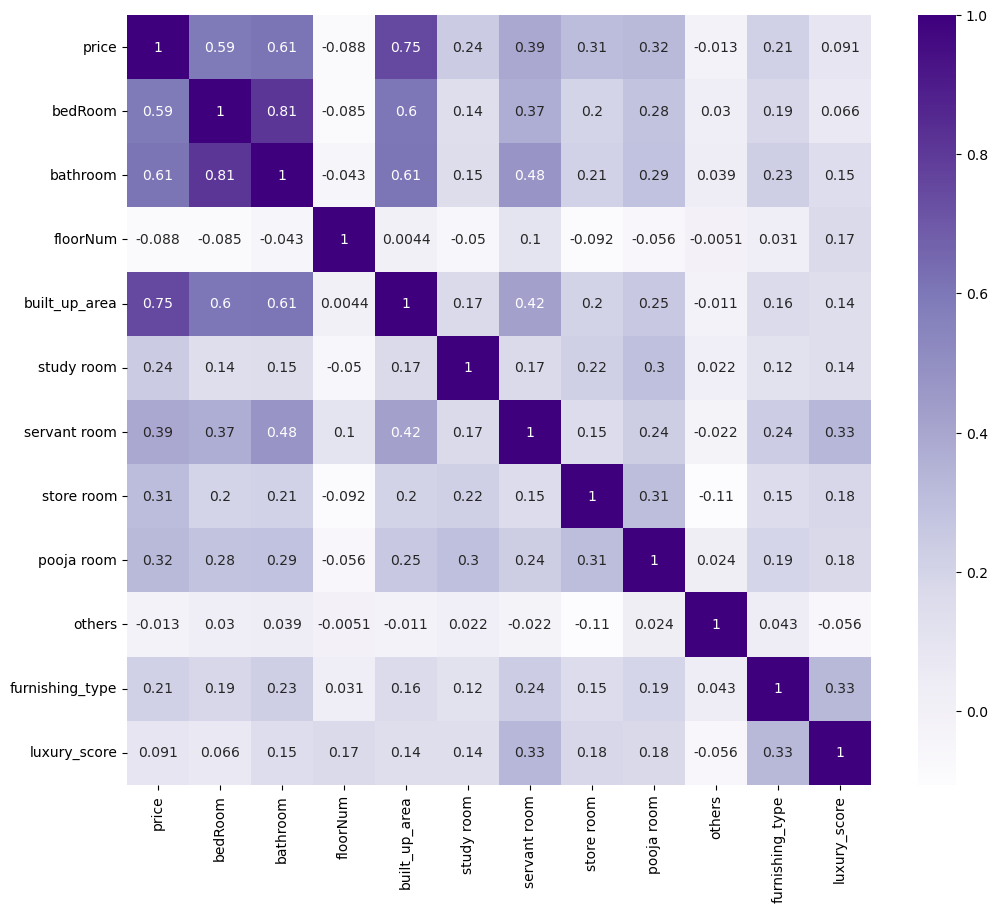

In [21]:
numeric_df = train_df.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr()

# Now, plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Purples')
plt.show()

1. Built-up Area (0.751246): Strong positive correlation. Understand the unit of measurement and ensure it aligns with the analysis.

2. Bathroom (0.611849): Strong positive correlation. Verify the relevance of the bathroom count and check for outliers or unusual values.

3. Bedroom (0.591875): Strong positive correlation. Ensure the bedroom count is reasonable and consistent with the property type.

4. Servant Room (0.392129): Moderate positive correlation. Assess the importance of the servant room in determining price.


5. Pooja Room (0.321646): Moderate positive correlation. Examine the impact of pooja rooms on property prices.

6. Store Room (0.308905): Moderate positive correlation. Evaluate the significance of store rooms in influencing prices.

7. Study Room (0.241016): Weak positive correlation. Assess the impact of study rooms on property values.

8. Furnishing Type (0.214519): Weak positive correlation. Understand the impact of different furnishing types on prices.

9. Luxury Score (0.090549): Weak positive correlation. Explore how the luxury score contributes to property pricing.

10. Others (-0.013230): Weak negative correlation. Investigate features categorized as 'others' to understand their impact.

11- Floor Number (-0.087887): Weak negative correlation. Check for any anomalies or inconsistencies in the floor number data.



Note: The correlation values range from -1 to 1, where 1 indicates a strong positive correlation, -1 indicates a strong negative correlation, and 0 indicates no correlation. Ensure to further investigate the features with weaker correlations to confirm their relevance in the modeling process.


In [14]:
numeric_df.corr()['price'].sort_values(ascending=False)

price              1.000000
built_up_area      0.751246
bathroom           0.611849
bedRoom            0.591875
servant room       0.392129
pooja room         0.321646
store room         0.308905
study room         0.241016
furnishing_type    0.214519
luxury_score       0.090549
others            -0.013230
floorNum          -0.087887
Name: price, dtype: float64

- Certain features, such as Luxury Score, Floor Number, and Others, exhibit an unexpected negative correlation with property prices. 
- The notable surprise lies in understanding why Luxury Score shows a relatively low correlation. 
- Additionally, categorical features like Property Type, Sector, and Age Possession are present, necessitating a thorough analysis to determine their utility in predicting property prices. 
- Before applying modeling techniques, it is crucial to assess the significance of these features and employ feature selection techniques to enhance model accuracy.



# 1. Luxury Score

<Axes: >

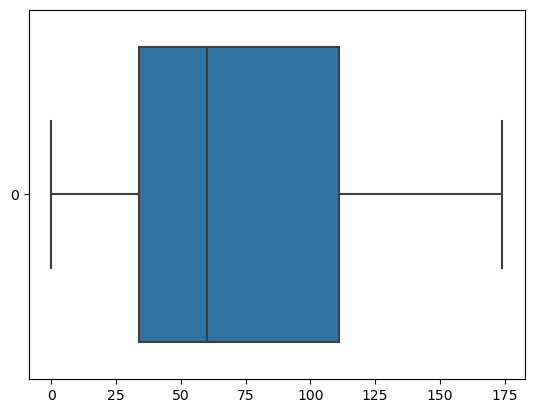

In [23]:
sns.boxplot(df['luxury_score'], orient='h')

In [24]:
def categorize_luxury(score):
    if 0 <= score < 50:
        return "low"
    elif 50 <= score < 150:
        return "medium"
    elif 150<= score < 175:
        return "High"
    else:
        return None  # or "Undefined" or any other label for scores outside the defined bins

In [25]:
train_df['luxury_category']= train_df['luxury_score'].apply(categorize_luxury)

In [26]:
train_df.head()

,property_type,sector,price,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score,luxury_category
0,flat,sector 113,3.05,3,4,3,3.0,Relatively New,2150.0,0,1,0,0,0,0,174,High
1,flat,sector 107,0.88,2,2,3+,3.0,Relatively New,1236.0,0,0,0,0,0,0,99,medium
2,house,sector 82,7.00,4,4,3+,3.0,Relatively New,3900.0,0,1,0,0,0,1,105,medium
3,house,sector 12,1.40,2,2,1,2.0,Old Property,166.0,0,0,0,0,0,0,0,low
4,flat,sector 10a,0.90,2,2,3,9.0,New Property,1086.0,0,0,0,0,1,0,52,medium


In [33]:
train_df.sample(5)

,property_type,sector,price,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score,luxury_category
2551,flat,sector 81,0.90,2,2,3,8.0,New Property,1231.0,0,0,0,0,1,0,60,medium
549,flat,sector 71,1.10,3,4,3,3.0,Moderately Old,1631.0,0,1,0,0,0,0,26,low
3154,flat,sector 37d,0.90,3,3,2,13.0,Relatively New,1185.0,0,0,0,0,0,1,37,low
2703,flat,sector 65,6.10,3,3,3,19.0,Moderately Old,3027.0,1,1,0,0,0,2,174,High
866,flat,sector 43,8.44,4,5,3,9.0,Moderately Old,5000.0,0,1,0,0,0,1,117,medium


In [34]:
train_df.shape

(3554, 17)


- The "luxury_score" is a numerical column representing the luxury level of a flat.
- To enhance user understanding, it is converted into a categorical column with three categories: budget flats, semi-luxury flats, and luxurious flats.
- A boxplot is applied to visualize the distribution of the luxury scores.
- Criteria for categorization are established based on the boxplot observations.
- If the luxury score falls between 0 to 50, it is labeled as a low or budget luxury flat.
- Scores between 50 to 150 are categorized as medium or semi-luxury flats.
- Luxury scores in the range of 150 to 175 are designated as high or luxurious flats.
- The categorization information is then stored in a new column called "luxury category."


# 2. Floor Number

<Axes: >

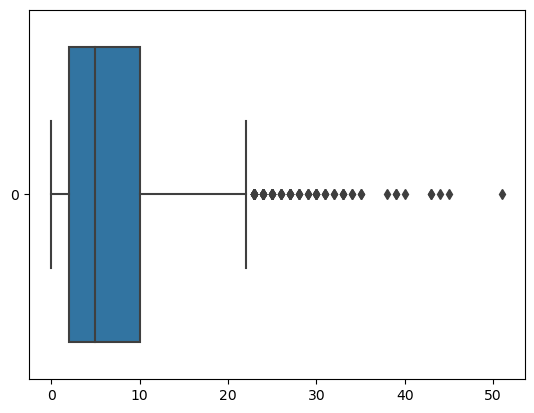

In [36]:
sns.boxplot(df['floorNum'], orient='h')

In [37]:
def categorize_floor(floor):
    if 0 <= floor <=2:
        return "Low Floor"
    elif 3<= floor <=10:
        return "Mid Floor"
    elif 11<= floor <=51:
        return "High Floor"
    else:
        return None # or "Undefined" or any other label for floors outside the defined bins

In [38]:
train_df['floor_category']= train_df['floorNum'].apply(categorize_floor)

- The "floorNum" column is transformed into a categorical feature for a more user-friendly interpretation.
- Instead of specific floor numbers, the goal is to classify flats based on their height characteristics.
- Flats with floor numbers between 0 to 2 are categorized as low-rise floors.
- Those with floor numbers from 3 to 10 are labeled as mid-rise floors.
- Flats with a floor number above 11 are considered high-rise floors.
- The classification is determined based on the distribution of data, aiming to provide users with a general idea of the building's height category.


In [43]:
train_df.sample(5)

,property_type,sector,price,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score,luxury_category,floor_category
414,flat,sector 37c,0.9,3,3,3,0.0,Under Construction,1500.0,0,0,0,0,0,0,66,medium,Low Floor
2910,flat,sector 84,0.9,3,3,3,11.0,Relatively New,1652.0,0,0,0,0,0,0,87,medium,High Floor
25,house,sector 17,9.5,8,8,3,3.0,Relatively New,4050.0,1,0,0,0,0,2,27,low,Mid Floor
583,house,sector 11,2.5,5,4,3,1.0,Old Property,1850.0,0,0,1,0,0,0,0,low,Low Floor
2351,flat,gwal pahari,7.5,4,4,3+,20.0,New Property,4842.0,0,1,0,1,1,2,49,low,High Floor


In [45]:
train_df.shape

(3554, 18)

In [46]:
train_df.drop(columns=['floorNum', 'luxury_score'], inplace=True)

In [47]:
train_df.columns

Index(['property_type', 'sector', 'price', 'bedRoom', 'bathroom', 'balcony',
       'agePossession', 'built_up_area', 'study room', 'servant room',
       'store room', 'pooja room', 'others', 'furnishing_type',
       'luxury_category', 'floor_category'],
      dtype='object')

In [48]:
train_df.shape

(3554, 16)

**converting categorical future into numerical**

- To apply various feature selection techniques, it's essential to convert categorical features into numerical format.
- Ordinal encoder is employed for this purpose, assigning numerical values to categorical features.
- The conversion ensures that both numerical and categorical features are in a format compatible with feature selection algorithms.


In [49]:
from sklearn.preprocessing import OrdinalEncoder

# Create a copy of the original data for label encoding
data_label_encoded = train_df.copy()

categorical_cols = train_df.select_dtypes(include=['object']).columns

# Apply label encoding to categorical columns
for col in categorical_cols:
    oe = OrdinalEncoder()
    data_label_encoded[col] = oe.fit_transform(data_label_encoded[[col]])
    print(oe.categories_)

# Splitting the dataset into training and testing sets
X_label = data_label_encoded.drop('price', axis=1)
y_label = data_label_encoded['price']

[array(['flat', 'house'], dtype=object)]
[array(['dwarka expressway', 'gwal pahari', 'manesar', 'sector 1',
       'sector 102', 'sector 103', 'sector 104', 'sector 105',
       'sector 106', 'sector 107', 'sector 108', 'sector 109',
       'sector 10a', 'sector 11', 'sector 110', 'sector 111',
       'sector 112', 'sector 113', 'sector 12', 'sector 13', 'sector 14',
       'sector 15', 'sector 17', 'sector 17a', 'sector 17b', 'sector 2',
       'sector 21', 'sector 22', 'sector 23', 'sector 24', 'sector 25',
       'sector 26', 'sector 27', 'sector 28', 'sector 3',
       'sector 3 phase 2', 'sector 3 phase 3 extension', 'sector 30',
       'sector 31', 'sector 33', 'sector 36', 'sector 36a', 'sector 37',
       'sector 37c', 'sector 37d', 'sector 38', 'sector 39', 'sector 4',
       'sector 40', 'sector 41', 'sector 43', 'sector 45', 'sector 46',
       'sector 47', 'sector 48', 'sector 49', 'sector 5', 'sector 50',
       'sector 51', 'sector 52', 'sector 53', 'sector 54', 'sector 5

In [50]:
X_label

,property_type,sector,bedRoom,bathroom,balcony,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_category,floor_category
0,0.0,17.0,3,4,3.0,3.0,2150.000000,0,1,0,0,0,0,0.0,2.0
1,0.0,9.0,2,2,4.0,3.0,1236.000000,0,0,0,0,0,0,2.0,2.0
2,1.0,93.0,4,4,4.0,3.0,3900.000000,0,1,0,0,0,1,2.0,2.0
3,1.0,18.0,2,2,1.0,2.0,166.000000,0,0,0,0,0,0,1.0,1.0
4,0.0,12.0,2,2,3.0,1.0,1086.000000,0,0,0,0,1,0,2.0,2.0
5,0.0,63.0,3,3,4.0,3.0,1900.000000,0,1,0,0,0,2,2.0,2.0
6,0.0,111.0,2,2,2.0,3.0,534.000000,0,0,0,0,0,0,2.0,2.0
7,0.0,93.0,4,4,4.0,3.0,1774.000000,0,1,0,0,0,0,2.0,1.0
8,0.0,4.0,3,3,3.0,3.0,1315.000000,0,1,0,0,0,0,2.0,2.0
9,0.0,44.0,2,2,3.0,1.0,625.000000,0,0,0,0,0,0,1.0,2.0


In [51]:
y_label

0        3.05
1        0.88
2        7.00
3        1.40
4        0.90
5        1.50
6        0.29
7        1.30
8        1.35
9        0.60
10       1.69
11       2.86
12       2.58
13       8.50
14       2.10
15       3.10
16       1.31
17       1.84
18       1.85
19       0.95
20       0.65
21       1.90
22       8.60
23       6.50
24       1.10
25       9.50
26       3.85
27       1.90
28       0.50
29       1.60
30       2.20
31       1.65
32       2.20
33       3.60
34       3.00
35       1.01
36       1.70
37       0.44
38       0.95
39       6.20
40       2.55
41       1.29
42       9.00
43       1.83
44       2.50
45       1.35
46       3.49
47       2.47
48       3.50
49       2.23
50       1.16
51       1.85
52       0.80
53       0.65
54       0.71
55       0.95
56       0.90
57       1.50
58       2.45
59       2.60
60       1.90
61       3.29
62       1.15
63       2.08
64       4.79
65       1.50
66       1.45
67       3.75
68       2.30
69       4.25
70       1.75
71    

# Applying 8 Feature Selection Technique

## Technique 1-  Correlation Analysis

In [52]:
data_label_encoded.shape

(3554, 16)

<Axes: >

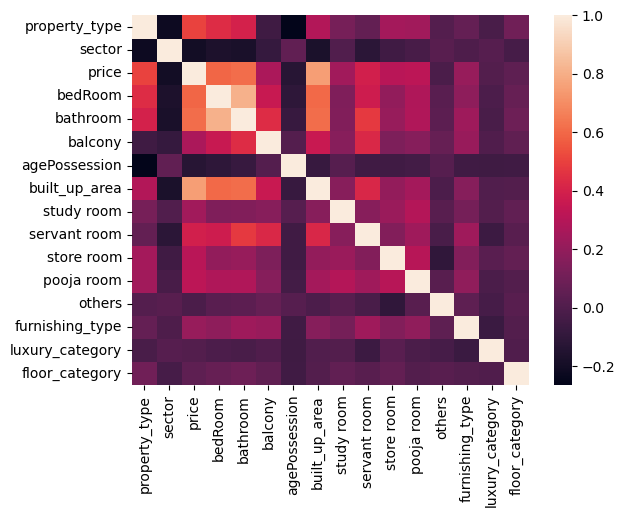

In [53]:
sns.heatmap(data_label_encoded.corr())

In [63]:
fi_df1= data_label_encoded.corr()['price'].iloc[1:].to_frame().reset_index().rename(columns={'index':'feature', 'price':'corr_coeff'})
fi_df1

,feature,corr_coeff
0,sector,-0.202302
1,price,1.000000
2,bedRoom,0.591875
3,bathroom,0.611849
4,balcony,0.270085
5,agePossession,-0.131290
6,built_up_area,0.751246
7,study room,0.241016
8,servant room,0.392129
9,store room,0.308905


- The correlation analysis is employed to unveil linear dependencies between different columns.
- Investigating the relationship between "Price" and other features is crucial.
- Notably, "Built-up Area" exhibits a robust correlation with price, indicating a significant influence.
- The number of bedrooms also displays a noteworthy positive correlation with the price of the property.


## Technique 2 - Random Forest Feature Importance

In [121]:
from sklearn.ensemble import RandomForestRegressor

#  Train a Random Forest regressor on label encoded data

rf_label = RandomForestRegressor(n_estimators=100, random_state=42)
rf_label.fit(X_label, y_label)

# Extract feature importance scores for label encoded data

fi_df2 = pd.DataFrame({
    'feature': X_label.columns,
    'rf_importance':rf_label.feature_importances_
}).sort_values(by='rf_importance', ascending=False)


In [122]:
fi_df2

,feature,rf_importance
6,built_up_area,0.650238
1,sector,0.105381
0,property_type,0.098814
2,bedRoom,0.028729
3,bathroom,0.025012
8,servant room,0.018731
5,agePossession,0.014437
4,balcony,0.012420
7,study room,0.008597
9,store room,0.008321


In [66]:
X_label.columns

Index(['property_type', 'sector', 'bedRoom', 'bathroom', 'balcony',
       'agePossession', 'built_up_area', 'study room', 'servant room',
       'store room', 'pooja room', 'others', 'furnishing_type',
       'luxury_category', 'floor_category'],
      dtype='object')

In [72]:
rf_label.feature_importances_

array([0.09881438, 0.10538076, 0.02872919, 0.02501173, 0.01242004,
       0.01443673, 0.65023814, 0.00859685, 0.01873128, 0.00832118,
       0.00517235, 0.00322696, 0.00711507, 0.00714156, 0.00666378])

**Embedded Technique - Feature Importance:**
    
- Utilizing tree-based algorithms like Random Forest, we can leverage inherent features that quantify the importance of each feature during the training process.
- Applying the Random Forest model to the entire dataset,extracted feature importance attributes.
- The analysis reveals that "Built-up Area" emerges as the most crucial feature, while others, such as "Luxury Score" and "Others," hold lesser significance in predicting property prices.



## Technique 3 - Gradient Boosting Feature importance's

In [73]:
from sklearn.ensemble import GradientBoostingRegressor

# Train a Gradient Boosting Regressor on label encoded data

gb_label = GradientBoostingRegressor()
gb_label.fit(X_label, y_label)

# Extract feature importance score for label encoded data

fi_df3 = pd.DataFrame({
    'feature': X_label.columns,
    'gb_importance': gb_label.feature_importances_
    
}).sort_values(by='gb_importance', ascending=False)

In [75]:
gb_label.feature_importances_

array([9.68554099e-02, 1.04587973e-01, 3.64599206e-02, 3.62523952e-02,
       1.94633291e-03, 4.28778253e-03, 6.76035227e-01, 2.31297098e-03,
       2.81793923e-02, 8.77597867e-03, 1.65566511e-04, 5.82313919e-04,
       1.81345451e-03, 1.22143043e-03, 5.23850757e-04])

In [76]:
fi_df3

,feature,gb_importance
6,built_up_area,0.676035
1,sector,0.104588
0,property_type,0.096855
2,bedRoom,0.036460
3,bathroom,0.036252
8,servant room,0.028179
9,store room,0.008776
5,agePossession,0.004288
7,study room,0.002313
4,balcony,0.001946


## Technique 4 - Permutation Importance

In [92]:
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split


X_train_label,X_test_label, y_train_label, y_test_label = train_test_split(X_label, y_label, test_size=0.2, random_state=42)

# train a Random Forest Regressor on Label Encoded data

rf_label = RandomForestRegressor(n_estimators=100, random_state=42)
rf_label.fit(X_train_label,y_train_label)

# calculate Permutation Importance

perm_importance = permutation_importance(rf_label, X_test_label, y_test_label, n_repeats=30, random_state=42)

# Organize result into dataframe

fi_df4 = pd.DataFrame({
    'feature': X_label.columns,
    'permutation_importance': perm_importance.importances_mean
}).sort_values(by='permutation_importance', ascending=False)

In [93]:
fi_df4

,feature,permutation_importance
6,built_up_area,0.607904
0,property_type,0.145407
1,sector,0.108194
8,servant room,0.012069
4,balcony,0.004426
3,bathroom,0.004084
7,study room,0.002299
5,agePossession,0.001050
14,floor_category,0.000329
11,others,-0.000130


- In permutation importance, trained a model and then systematically shuffle each feature individually to observe the impact on the model's performance.
- If shuffling a feature leads to a decrease in the performance score, it indicates that the feature plays a crucial role in explaining the target variable.
- Conversely, if shuffling results in an increased score, the feature is considered less important.
- In analysis, identified six features with negative importance values. This suggests that when these features were individually shuffled, the model's performance improved, implying that these features may have a lesser impact on predicting the target variable.

## Technique 5 - LASSO

In [98]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Standardize the Features
scaler = StandardScaler()
X_scaled= scaler.fit_transform(X_label)

# Train a Lasso Regression Model
# I will use a relatively small value for alpha (The Regularization Strength) for demonstration purposes

lasso = Lasso(alpha=0.01, random_state=42)
lasso.fit(X_scaled, y_label)

# Extract Coefficients
fi_df5 = pd.DataFrame({
    'feature': X_label.columns,
    'lasso_coeff': lasso.coef_
    
}).sort_values(by='lasso_coeff', ascending=False)

In [99]:
lasso.coef_

array([ 0.71365015, -0.05309982,  0.01924008,  0.27966219, -0.04467182,
       -0.        ,  1.5239687 ,  0.175871  ,  0.16765095,  0.19875428,
        0.07491484, -0.01412175,  0.13599714,  0.0505306 , -0.00178642])

In [100]:
fi_df5

,feature,lasso_coeff
6,built_up_area,1.523969
0,property_type,0.713650
3,bathroom,0.279662
9,store room,0.198754
7,study room,0.175871
8,servant room,0.167651
12,furnishing_type,0.135997
10,pooja room,0.074915
13,luxury_category,0.050531
2,bedRoom,0.019240


- Lasso is a linear model that requires feature scaling before application. 
- In analysis,scaled the entire dataset. 
- When applying Lasso with an alpha value of 0.01, found that, similar to other techniques, "Built Up Area" emerged as the most important feature according to Lasso.

## Technique 6 - RFE (Recursive Feature Elimination)

In [104]:
from sklearn.feature_selection import RFE

# Initialize the base estimator
estimator = RandomForestRegressor()

# Apply RFE on the label-encoded and standardized training data
selector_label = RFE(estimator, n_features_to_select = X_label.shape[1], step = 1)
selector_label = selector_label.fit(X_label, y_label)

# Get the selected features based on RFE
selected_features = X_label.columns[selector_label.support_]

# Extract the coefficients for the selceted features from the underlying linear regression model
selected_coefficients = selector_label.estimator_.feature_importances_

# Organize the results into a DataFrame

fi_df6 = pd.DataFrame({
    'feature': selected_features,
    'rfe_score': selected_coefficients

}).sort_values(by='rfe_score', ascending = False)

In [109]:
fi_df6

,feature,rfe_score
6,built_up_area,0.652453
1,sector,0.105241
0,property_type,0.098018
2,bedRoom,0.027706
3,bathroom,0.024102
8,servant room,0.019048
5,agePossession,0.014036
4,balcony,0.012848
7,study room,0.009289
12,furnishing_type,0.007524


In [108]:
X_label.columns[selector_label.support_]

Index(['property_type', 'sector', 'bedRoom', 'bathroom', 'balcony',
       'agePossession', 'built_up_area', 'study room', 'servant room',
       'store room', 'pooja room', 'others', 'furnishing_type',
       'luxury_category', 'floor_category'],
      dtype='object')

In [105]:
selector_label.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

In [106]:
selector_label.estimator_.feature_importances_

array([0.09801757, 0.10524127, 0.027706  , 0.02410249, 0.01284843,
       0.0140358 , 0.65245319, 0.00928891, 0.0190482 , 0.00711065,
       0.0064045 , 0.00330246, 0.0075237 , 0.00703586, 0.00588097])

- In this technique, the process begins by training a model with all the features. 
- Subsequently, one feature is removed iteratively, and the model is retrained to assess the importance of each feature. 
- In this instance, a random regressor model was employed, and the Recursive Feature Elimination (RFE) technique was applied. 
- According to RFE, the most important feature is still "Built Up Area."

## Technique 7 - Linear Regression Weights

In [111]:
# Train a linear regression model on the label-encoded and standardized training data
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X_scaled, y_label)

# Extract Coefficients
fi_df7 = pd.DataFrame({
    'feature': X_label.columns,
    'reg_coeff': lin_reg.coef_
}).sort_values(by='reg_coeff', ascending=False)

In [112]:
lin_reg.coef_

array([ 7.13472748e-01, -6.19837693e-02,  2.23441106e-02,  2.86195949e-01,
       -6.76823570e-02,  1.14561493e-03,  1.52646792e+00,  1.84130136e-01,
        1.77033110e-01,  2.03013458e-01,  7.78558211e-02, -2.20475039e-02,
        1.45261404e-01,  6.17845811e-02, -1.24935422e-02])

In [113]:
fi_df7

,feature,reg_coeff
6,built_up_area,1.526468
0,property_type,0.713473
3,bathroom,0.286196
9,store room,0.203013
7,study room,0.184130
8,servant room,0.177033
12,furnishing_type,0.145261
10,pooja room,0.077856
13,luxury_category,0.061785
2,bedRoom,0.022344


- Train a linear model, and the weights assigned to each feature become the feature importance scores.
- Note that this technique might not be very reliable in this case, especially when applying ordinal encoding instead of one-hot encoding for nominal data types.
- For more reliable results, consider using tree-based models, as they tend to perform well with ordinal encoding.



## Technique 8 - SHAP

**SHAP (SHapley Additive exPlanations) is a popular technique used for interpreting the output of machine learning models. It provides a way to understand the contribution of each feature to the model's prediction for a specific instance**

In [114]:
!pip install shap

python(3625) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Obtaining dependency information for shap from https://files.pythonhosted.org/packages/f6/5e/eb46f7b7e64318377adf7dec0e38e22c022b256eb51985fd14e4b9eb5084/shap-0.44.0-cp311-cp311-macosx_10_9_x86_64.whl.metadata
  Obtaining dependency information for joblib>=1.1.1 from https://files.pythonhosted.org/packages/10/40/d551139c85db202f1f384ba8bcf96aca2f329440a844f924c8a0040b6d02/joblib-1.3.2-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.9/450.9 kB 6.4 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 6.6 MB/s eta 0:00:00:00:01
  Attempting uninstall: joblib
    Found existing installation: joblib 1.0.1
    Uninstalling joblib-1.0.1:
      Successfully uninstalled joblib-1.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.1.0 requires joblib~=1.0.1, but you have joblib 1.3.2 which is inc

In [115]:
import shap

In [116]:
# compute shap value using trained random forest model

rf = RandomForestRegressor(n_estimators=100,random_state=42)
rf.fit(X_label,y_label)

explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_label)

# summing the absolute shap values across all samples to get an overall measure of feature importance

shap_sum = np.abs(shap_values).mean(axis=0)

shap_values

array([[-4.28068649e-01,  1.68309300e-01, -1.72272264e-02, ...,
        -1.18146759e-02,  6.09091572e-02, -5.70269279e-03],
       [-1.92551948e-01, -2.08692840e-01, -6.48062231e-02, ...,
        -5.70547606e-03,  6.66058696e-03, -1.06017235e-02],
       [ 9.09727933e-01, -1.23617097e+00, -6.71148322e-02, ...,
         1.17537220e-01,  3.09147560e-02,  2.22962834e-02],
       ...,
       [-4.84985754e-01,  4.23925546e-01, -3.48127466e-02, ...,
        -7.99834658e-03,  4.38422534e-02, -1.19498771e-01],
       [ 4.88321020e-01,  1.20160721e-01, -3.93143987e-04, ...,
        -1.13198586e-02, -1.73479319e-02, -7.87480446e-03],
       [-3.11686079e-01, -6.06038171e-01,  1.34362841e-02, ...,
        -1.82112827e-02, -1.25724218e-02,  1.43310798e-02]])

In [118]:
fi_df8 = pd.DataFrame({
    'feature': X_label.columns,
    'SHAP_score': np.abs(shap_values).mean(axis=0)
}).sort_values(by='SHAP_score', ascending= False)

fi_df8

,feature,SHAP_score
6,built_up_area,1.255358
0,property_type,0.467628
1,sector,0.387515
3,bathroom,0.114173
8,servant room,0.094996
2,bedRoom,0.059688
4,balcony,0.039367
5,agePossession,0.026534
14,floor_category,0.024378
7,study room,0.020085


In [119]:
shap_sum

array([0.46762784, 0.38751541, 0.05968804, 0.11417262, 0.03936721,
       0.02653374, 1.25535769, 0.02008544, 0.09499623, 0.01815301,
       0.01001838, 0.00727372, 0.01908324, 0.01756807, 0.02437767])

- Compute SHAP values with a Random Forest model (rf).
- Use shap.TreeExplainer to interpret feature impacts.
- Sum absolute SHAP values for each feature (shap_sum).
- Create shap_valuesfi_df8 to rank features by average SHAP scores.
- Analyze top features, considering positive/negative impacts.
- Utilize summary plots or individual feature plots for visualization.
- Assess model consistency by aligning predictions with feature impacts.
- Seek unexpected patterns or insights from high SHAP-scoring features.
- SHAP values aid detailed model interpretation and decision-making.


In [123]:
final_fi_df = fi_df1.merge(fi_df2,on='feature').merge(fi_df3,on='feature').merge(fi_df4,on='feature').merge(fi_df5,on='feature').merge(fi_df6,on='feature').merge(fi_df7,on='feature').merge(fi_df8,on='feature').set_index('feature')

In [124]:
final_fi_df

,corr_coeff,rf_importance,gb_importance,permutation_importance,lasso_coeff,rfe_score,reg_coeff,SHAP_score
feature,,,,,,,,
sector,-0.202302,0.105381,0.104588,0.108194,-0.053100,0.105241,-0.061984,0.387515
bedRoom,0.591875,0.028729,0.036460,-0.015708,0.019240,0.027706,0.022344,0.059688
bathroom,0.611849,0.025012,0.036252,0.004084,0.279662,0.024102,0.286196,0.114173
balcony,0.270085,0.012420,0.001946,0.004426,-0.044672,0.012848,-0.067682,0.039367
agePossession,-0.131290,0.014437,0.004288,0.001050,-0.000000,0.014036,0.001146,0.026534
built_up_area,0.751246,0.650238,0.676035,0.607904,1.523969,0.652453,1.526468,1.255358
study room,0.241016,0.008597,0.002313,0.002299,0.175871,0.009289,0.184130,0.020085
servant room,0.392129,0.018731,0.028179,0.012069,0.167651,0.019048,0.177033,0.094996
store room,0.308905,0.008321,0.008776,-0.001184,0.198754,0.007111,0.203013,0.018153


In [134]:
# normalize the score

final_fi_df = final_fi_df.divide(final_fi_df.sum(axis=0), axis=1)
final_fi_df

,corr_coeff,rf_importance,gb_importance,permutation_importance,lasso_coeff,rfe_score,reg_coeff,SHAP_score
feature,,,,,,,,
sector,-0.059293,0.116936,0.115804,0.152470,-0.021131,0.116678,-0.024587,0.185043
bedRoom,0.173473,0.031879,0.040370,-0.022136,0.007656,0.030717,0.008863,0.028502
bathroom,0.179327,0.027754,0.040140,0.005756,0.111290,0.026722,0.113524,0.054519
balcony,0.079159,0.013782,0.002155,0.006237,-0.017777,0.014245,-0.026847,0.018798
agePossession,-0.038480,0.016020,0.004748,0.001480,-0.000000,0.015561,0.000454,0.012670
built_up_area,0.220183,0.721536,0.748535,0.856677,0.606456,0.723355,0.605495,0.599448
study room,0.070639,0.009539,0.002561,0.003240,0.069987,0.010298,0.073038,0.009591
servant room,0.114929,0.020785,0.031201,0.017007,0.066716,0.021118,0.070223,0.045362
store room,0.090537,0.009234,0.009717,-0.001669,0.079093,0.007883,0.080528,0.008668


In [126]:
final_fi_df.sum(axis=0) 

corr_coeff                3.411919
rf_importance             0.901186
gb_importance             0.903145
permutation_importance    0.709607
lasso_coeff               2.512910
rfe_score                 0.901982
reg_coeff                 2.521025
SHAP_score                2.094191
dtype: float64

In [132]:
(-0.202302 / 3.411919)

-0.05929273233039823

In [136]:
final_fi_df[['rf_importance','gb_importance','permutation_importance','rfe_score','SHAP_score']].mean(axis=1).sort_values(ascending=False)

feature
built_up_area      0.729910
sector             0.137386
bathroom           0.030978
servant room       0.027095
bedRoom            0.021866
balcony            0.011043
agePossession      0.010096
study room         0.007046
store room         0.006767
floor_category     0.005320
furnishing_type    0.004840
luxury_category    0.002817
pooja room         0.002600
others             0.002235
dtype: float64

In [137]:
X_label

,property_type,sector,bedRoom,bathroom,balcony,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_category,floor_category
0,0.0,17.0,3,4,3.0,3.0,2150.000000,0,1,0,0,0,0,0.0,2.0
1,0.0,9.0,2,2,4.0,3.0,1236.000000,0,0,0,0,0,0,2.0,2.0
2,1.0,93.0,4,4,4.0,3.0,3900.000000,0,1,0,0,0,1,2.0,2.0
3,1.0,18.0,2,2,1.0,2.0,166.000000,0,0,0,0,0,0,1.0,1.0
4,0.0,12.0,2,2,3.0,1.0,1086.000000,0,0,0,0,1,0,2.0,2.0
5,0.0,63.0,3,3,4.0,3.0,1900.000000,0,1,0,0,0,2,2.0,2.0
6,0.0,111.0,2,2,2.0,3.0,534.000000,0,0,0,0,0,0,2.0,2.0
7,0.0,93.0,4,4,4.0,3.0,1774.000000,0,1,0,0,0,0,2.0,1.0
8,0.0,4.0,3,3,3.0,3.0,1315.000000,0,1,0,0,0,0,2.0,2.0
9,0.0,44.0,2,2,3.0,1.0,625.000000,0,0,0,0,0,0,1.0,2.0


In [140]:
# with all the cols

from sklearn.model_selection import cross_val_score

rf = RandomForestRegressor(n_estimators=100, random_state=42)

scores = cross_val_score(rf,X_label, y_label, cv=5, scoring='r2')


In [141]:
scores

array([0.78903026, 0.83307914, 0.82335646, 0.77344486, 0.81884363])

In [142]:
scores.mean()

0.8075508715868974

In [143]:
# removing pooja room , study room , others 
rf = RandomForestRegressor(n_estimators=100, random_state=42)

scores = cross_val_score(rf,X_label.drop(columns=['pooja room', 'study room', 'others']), y_label, cv=5, scoring='r2')

In [144]:
scores

array([0.7906251 , 0.82338518, 0.82466038, 0.76651202, 0.82412125])

In [145]:
scores.mean()

0.8058607874364403

In [146]:
export_df = X_label.drop(columns=['pooja room', 'study room', 'others'])
export_df['price'] = y_label

In [147]:
export_df

,property_type,sector,bedRoom,bathroom,balcony,agePossession,built_up_area,servant room,store room,furnishing_type,luxury_category,floor_category,price
0,0.0,17.0,3,4,3.0,3.0,2150.000000,1,0,0,0.0,2.0,3.05
1,0.0,9.0,2,2,4.0,3.0,1236.000000,0,0,0,2.0,2.0,0.88
2,1.0,93.0,4,4,4.0,3.0,3900.000000,1,0,1,2.0,2.0,7.00
3,1.0,18.0,2,2,1.0,2.0,166.000000,0,0,0,1.0,1.0,1.40
4,0.0,12.0,2,2,3.0,1.0,1086.000000,0,0,0,2.0,2.0,0.90
5,0.0,63.0,3,3,4.0,3.0,1900.000000,1,0,2,2.0,2.0,1.50
6,0.0,111.0,2,2,2.0,3.0,534.000000,0,0,0,2.0,2.0,0.29
7,0.0,93.0,4,4,4.0,3.0,1774.000000,1,0,0,2.0,1.0,1.30
8,0.0,4.0,3,3,3.0,3.0,1315.000000,1,0,0,2.0,2.0,1.35
9,0.0,44.0,2,2,3.0,1.0,625.000000,0,0,0,1.0,2.0,0.60


In [148]:
export_df.shape

(3554, 13)

In [149]:
export_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3554 entries, 0 to 3553
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   property_type    3554 non-null   float64
 1   sector           3554 non-null   float64
 2   bedRoom          3554 non-null   int64  
 3   bathroom         3554 non-null   int64  
 4   balcony          3554 non-null   float64
 5   agePossession    3554 non-null   float64
 6   built_up_area    3554 non-null   float64
 7   servant room     3554 non-null   int64  
 8   store room       3554 non-null   int64  
 9   furnishing_type  3554 non-null   int64  
 10  luxury_category  3554 non-null   float64
 11  floor_category   3554 non-null   float64
 12  price            3554 non-null   float64
dtypes: float64(8), int64(5)
memory usage: 361.1 KB


In [150]:
export_df.to_csv('gurgaon_properties_post_feature_selection.csv', index=False)